# Part 1. Denoising
Denoise the image using appropriate filter. 
Summarize your observations as: 
a. What is the prominent noise identified in the image or introduced by yourself in the given image? 
b. Type of filter used to denoise 
c. Plot the residual_imgs and analyze the performance of filter using the metric, PSNR

In [1]:
import numpy as np
import math
import random
from PIL import Image 
import matplotlib.pyplot as plt
from matplotlib import image
import cv2

In [2]:
def plotHist(img,showw):
    hist,bins = np.histogram(img.flatten(),256,[0,256])
    cdf = hist.cumsum()
    cdf_normalized = cdf * float(hist.max()) / cdf.max()
    plt.plot(cdf_normalized, color = 'r')
    plt.hist(img.flatten(),256,[0,256], color = 'g')
    plt.xlim([0,256])
    plt.legend(('cdf','histogram'), loc = 'lower right')
    if showw == "True":
        plt.show()
    return plt

def PSNR(img, denoised_img):
    mse = np.mean((img - denoised_img) ** 2)
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr

def PSNR(image1, image2):

    # OpenCV
    #psnr =  cv2.PSNR(image1, image2)
    #print('OpenCV PSNR: ',psnr)39

    # Own implementation
    mse = np.mean((image1.astype(np.float64) / 255 - image2.astype(np.float64) / 255) ** 2)
    psnr = 10 * math.log10(1. / mse)
    #print('Own implementation: ', 10 * math.log10(1. / mse))
    return psnr


In [3]:
def sp_noise(image,prob):
    '''
    Add salt and pepper noise to image
    prob: Probability of the noise
    '''
    output = np.zeros(image.shape,np.uint8)
    thres = 1 - prob 
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            rdenoised = random.random()
            if rdenoised < prob:
                output[i][j] = 0
            elif rdenoised > thres:
                output[i][j] = 255
            else:
                output[i][j] = image[i][j]
    return output



In [4]:
def add_gaussian_noise(image,var):
    row,col= image.shape
    mean = 0
    #var = 0.1
    sigma = var**0.5
    gauss = np.random.normal(mean,sigma,(row,col))
    gauss = gauss.reshape(row,col)
    noisy = image + gauss
    #noisy = cv2.normalize(noisy, None, alpha = 0, beta = 255, norm_type = cv2.NORM_MINMAX, dtype = cv2.CV_32F)
    return noisy


In [5]:
ct_img1 = cv2.imread('39.JPG', 0)

In [6]:
ct_img2 = cv2.imread('49.JPG', 0)

<function matplotlib.pyplot.show(close=None, block=None)>

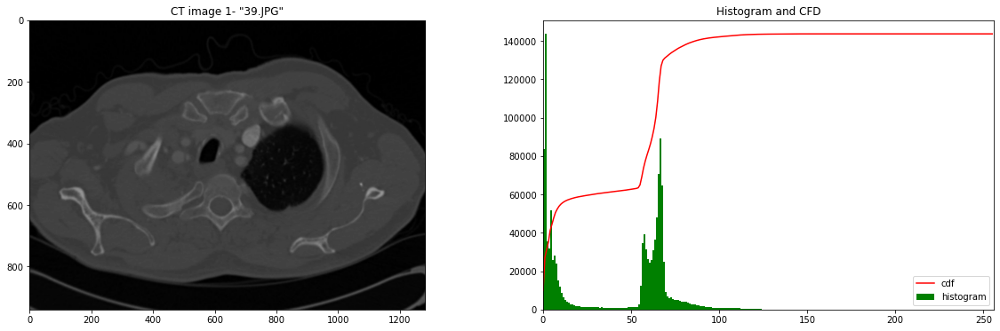

In [7]:
plt.figure(figsize = (20,6))
plt.subplot(1,2,1)
plt.imshow(ct_img1, cmap = 'gray', vmin = 0, vmax = 255 )
plt.title(label = 'CT image 1- "39.JPG"')

plt.subplot(1,2,2)
plotHist(ct_img1,"False")
plt.title(label = 'Histogram and CFD')
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

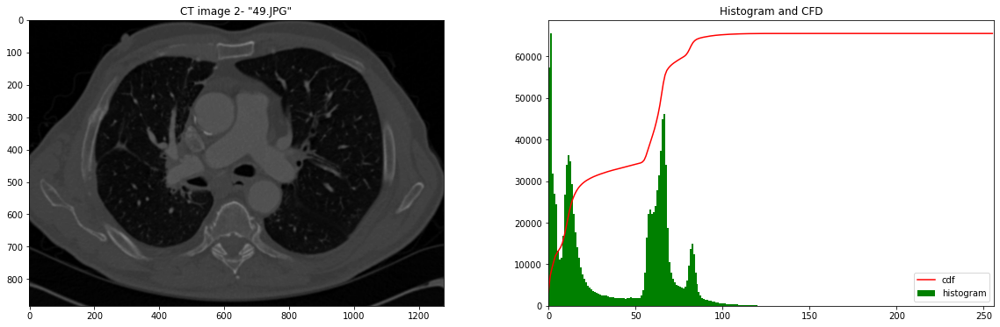

In [8]:
plt.figure(figsize = (20,6))
plt.subplot(1,2,1)
plt.imshow(ct_img2, cmap = 'gray', vmin = 0, vmax = 255 )
plt.title(label = 'CT image 2- "49.JPG"')

plt.subplot(1,2,2)
plotHist(ct_img2,"False")
plt.title(label = 'Histogram and CFD')
plt.show

In [9]:
def filter_img_and_plot(ct_img, filtered_img, filter_type, title):
    residual_img = ct_img - filtered_img
    plt.figure(figsize = (20,10))
    plt.subplot(2,3,1)
    plt.imshow(ct_img, cmap = 'gray', vmin = 0, vmax = 255 )
    plt.title(label = title)

    plt.subplot(2,3,2)
    plt.imshow(filtered_img, cmap = 'gray', vmin = 0, vmax = 255 )
    plt.title(label = 'Denoised with '+ filter_type + ' Filter')

    plt.subplot(2,3,3)
    plt.imshow(residual_img, cmap = 'gray', vmin = 0, vmax = 255 )
    plt.title(label = 'Residual Image')

    plt.subplot(2,3,4)
    plotHist(ct_img2, "False")
    plt.subplot(2,3,5)
    plotHist(filtered_img, "False")
    plt.subplot(2,3,6)
    plotHist(residual_img, "False")
    plt.show()
    psnr = round(PSNR(ct_img, filtered_img),2)
    print( 'PSNR after Denoising with '+ filter_type + ' Filter: ', psnr )
    return psnr

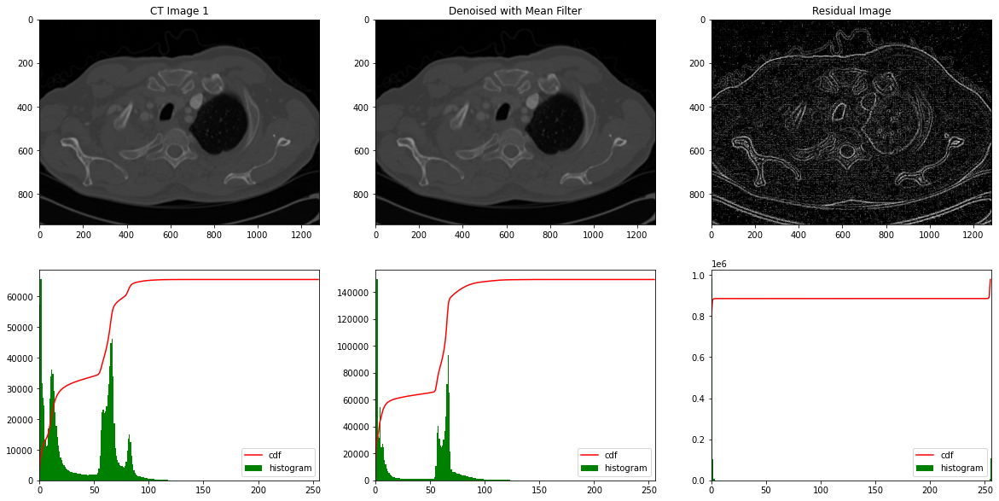

PSNR after Denoising with Mean Filter:  54.17


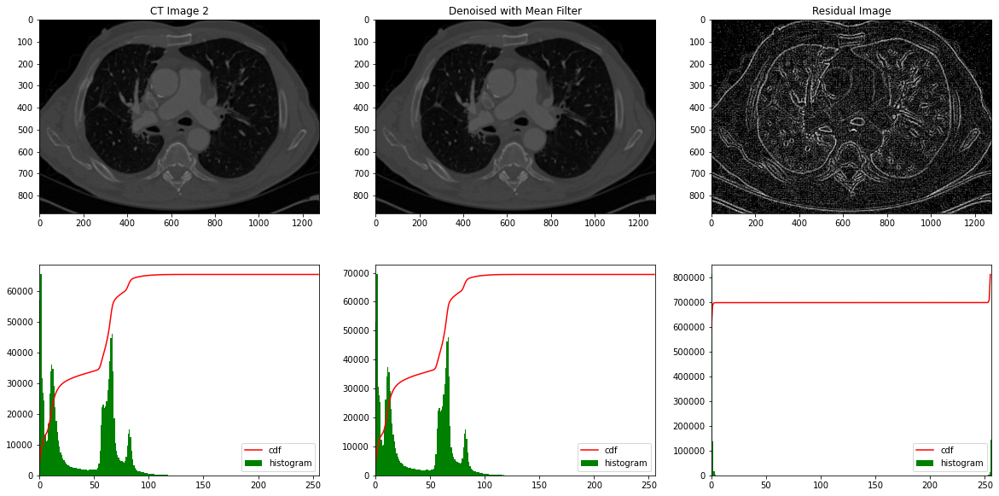

PSNR after Denoising with Mean Filter:  52.18


In [10]:
# Mean filter denoising
mean_denoised_ct_img1 = cv2.blur(ct_img1,(3,3))
psnr_mean_1 = filter_img_and_plot(ct_img1, mean_denoised_ct_img1, "Mean", "CT Image 1")

mean_denoised_ct_img2 = cv2.blur(ct_img2,(3,3))
psnr_mean_2 = filter_img_and_plot(ct_img2, mean_denoised_ct_img2, "Mean", "CT Image 2")


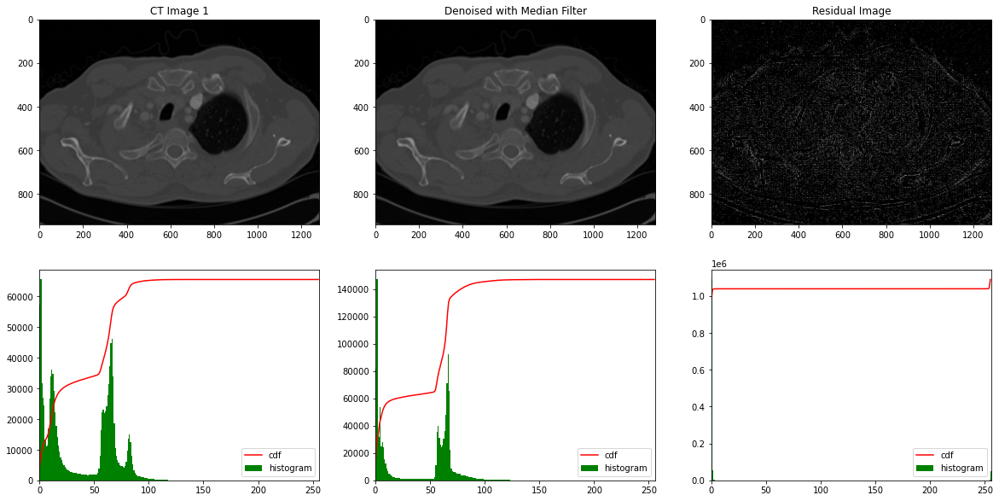

PSNR after Denoising with Median Filter:  57.04


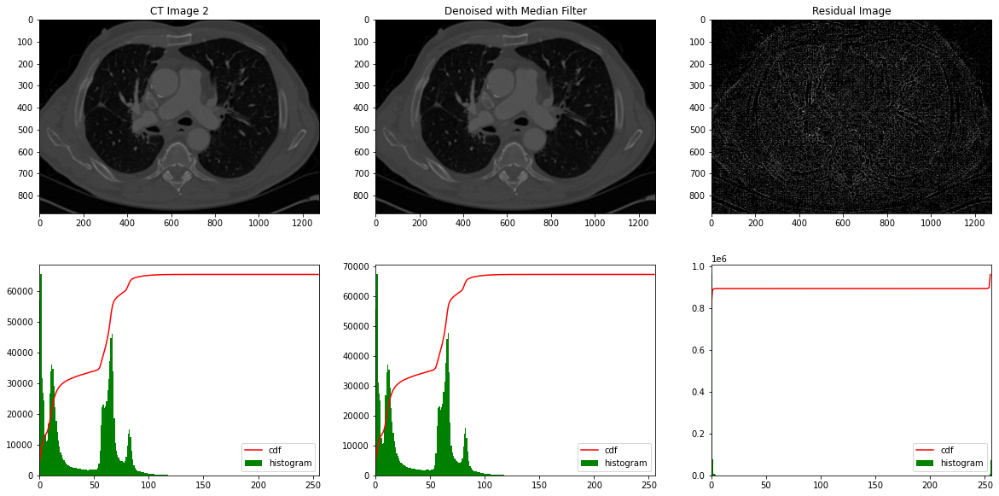

PSNR after Denoising with Median Filter:  54.78


In [11]:
# Median filter denoising
median_denoised_img1 = cv2.medianBlur(ct_img1,3)
psnr_median_1 = filter_img_and_plot(ct_img1, median_denoised_img1, "Median","CT Image 1")

median_denoised_img2 = cv2.medianBlur(ct_img2,3)
psnr_median_2 = filter_img_and_plot(ct_img2, median_denoised_img2, "Median", "CT Image 2")



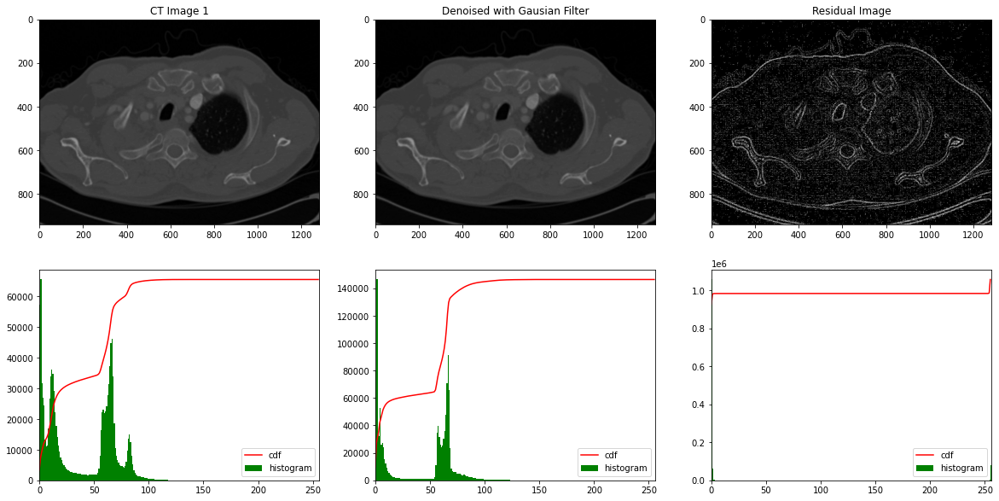

PSNR after Denoising with Gausian Filter:  56.52


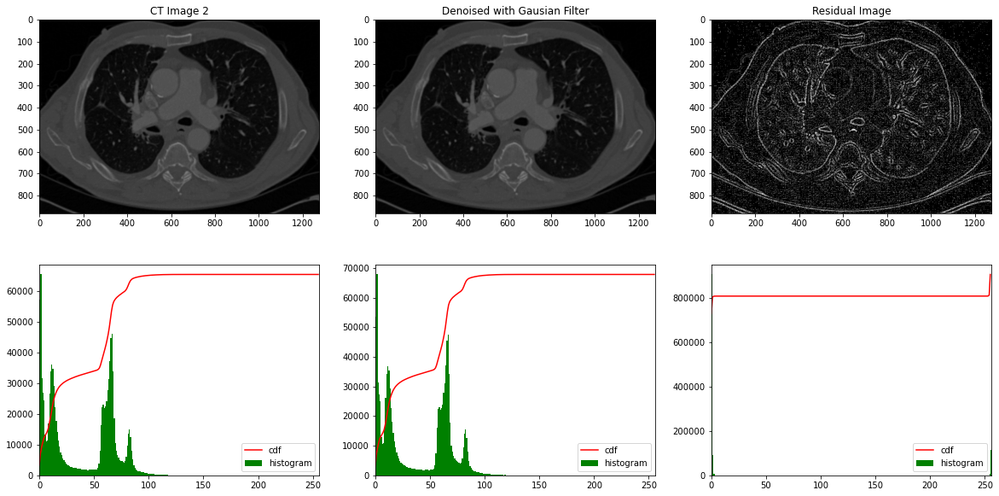

PSNR after Denoising with Gausian Filter:  54.38


In [12]:
# Gausian filter denoising
GaussianBlur_denoised_img1 = cv2.GaussianBlur(ct_img1,(3,3), 0)
psnr_gaus_1 = filter_img_and_plot(ct_img1, GaussianBlur_denoised_img1, "Gausian","CT Image 1")

GaussianBlur_denoised_img2 = cv2.GaussianBlur(ct_img2,(3,3), 0)
psnr_gaus_2 = filter_img_and_plot(ct_img2, GaussianBlur_denoised_img2, "Gausian", "CT Image 2")


In [13]:
print("PSNR after denoising CT image 1 with Mean filter", psnr_mean_1)
print("PSNR after denoising CT image 1 with Median filter", psnr_median_1)
print("PSNR after denoising CT image 1 with Gausian filter", psnr_gaus_1)


PSNR after denoising CT image 1 with Mean filter 54.17
PSNR after denoising CT image 1 with Median filter 57.04
PSNR after denoising CT image 1 with Gausian filter 56.52


In [14]:
print("PSNR after denoising CT image 2 with Mean filter", psnr_mean_2)
print("PSNR after denoising CT image 2 with Median filter", psnr_median_2)
print("PSNR after denoising CT image 2 with Gausian filter", psnr_gaus_2)

PSNR after denoising CT image 2 with Mean filter 52.18
PSNR after denoising CT image 2 with Median filter 54.78
PSNR after denoising CT image 2 with Gausian filter 54.38


In [15]:
cv2.imwrite("Gaus_ct1.png",GaussianBlur_denoised_img1)
cv2.imwrite("Gaus_ct2.png",GaussianBlur_denoised_img2)

True

# 1.2 Introducing artificial noise

In [73]:
def filter_noised_img_and_plot(ct_img,noised_ct_img, filtered_img, filter_type, title):
    residual_img = ct_img - filtered_img
    plt.figure(figsize = (20,10))
    plt.subplot(2,3,1)
    plt.imshow(noised_ct_img, cmap = 'gray', vmin = 0, vmax = 255 )
    plt.title(label = title)

    plt.subplot(2,3,2)
    plt.imshow(filtered_img, cmap = 'gray', vmin = 0, vmax = 255 )
    plt.title(label = 'Denoised with '+ filter_type + ' Filter')

    plt.subplot(2,3,3)
    plt.imshow(residual_img, cmap = 'gray', vmin = 0, vmax = 255 )
    plt.title(label = 'Residual Image')

    plt.subplot(2,3,4)
    plotHist(ct_img2, "False")
    plt.subplot(2,3,5)
    plotHist(filtered_img, "False")
    plt.subplot(2,3,6)
    plotHist(residual_img, "False")
    plt.show()
    psnr = round(PSNR(noised_ct_img, filtered_img),2)
    print( 'PSNR of '+title+ ' w.r.t. to the original image: ', round(PSNR(ct_img,noised_ct_img),2) )
    print( 'PSNR after Denoising with '+ filter_type + ' Filter w.r.t. to '+title+':', psnr )
    print("PSNR of "+ title + " Denoised with "+ filter_type+ " filter w.r.t. to original image: ",round(PSNR(ct_img,filtered_img),2))
    return psnr

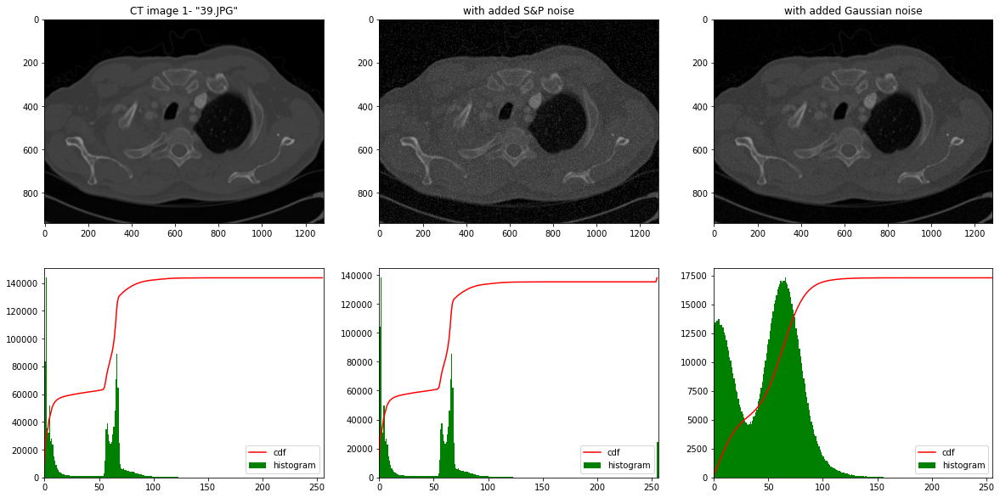

In [74]:
# Adding noise in CT image 1
sp_noised_ct1 = sp_noise(ct_img1,0.02)
gaus_noised_ct1 = add_gaussian_noise(ct_img1,200)

plt.figure(figsize = (20,10))
plt.subplot(2,3,1)
plt.imshow(ct_img1, cmap = 'gray', vmin = 0, vmax = 255 )
plt.title(label = 'CT image 1- "39.JPG"')

plt.subplot(2,3,2)
plt.imshow(sp_noised_ct1, cmap = 'gray', vmin = 0, vmax = 255 )
plt.title(label = 'with added S&P noise')

plt.subplot(2,3,3)
plt.imshow(gaus_noised_ct1, cmap = 'gray', vmin = 0, vmax = 255 )
plt.title(label = 'with added Gaussian noise')

plt.subplot(2,3,4)
plotHist(ct_img1, "False")
plt.subplot(2,3,5)
plotHist(sp_noised_ct1, "False")
plt.subplot(2,3,6)
plotHist(gaus_noised_ct1, "False")
plt.show()

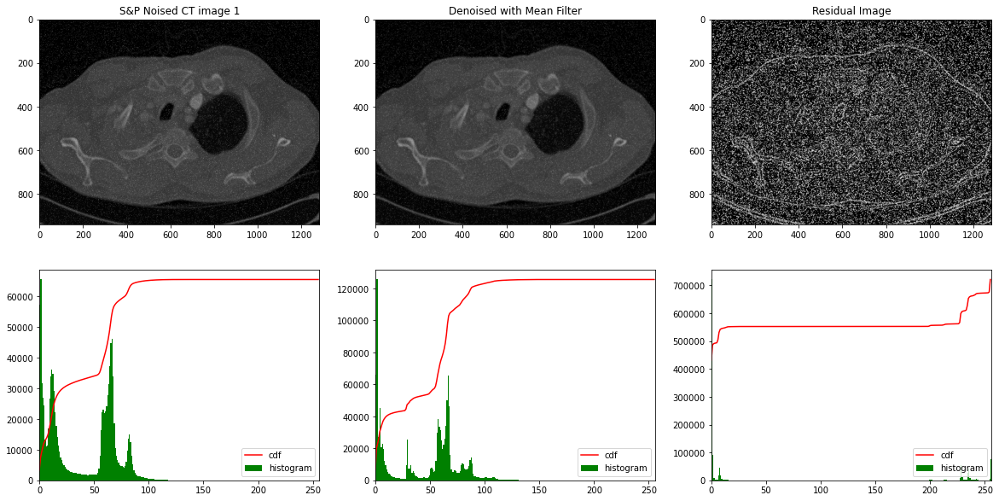

PSNR of S&P Noised CT image 1 w.r.t. to the original image:  18.09
PSNR after Denoising with Mean Filter w.r.t. to S&P Noised CT image 1: 18.67
PSNR of S&P Noised CT image 1 Denoised with Mean filter w.r.t. to original image:  27.15


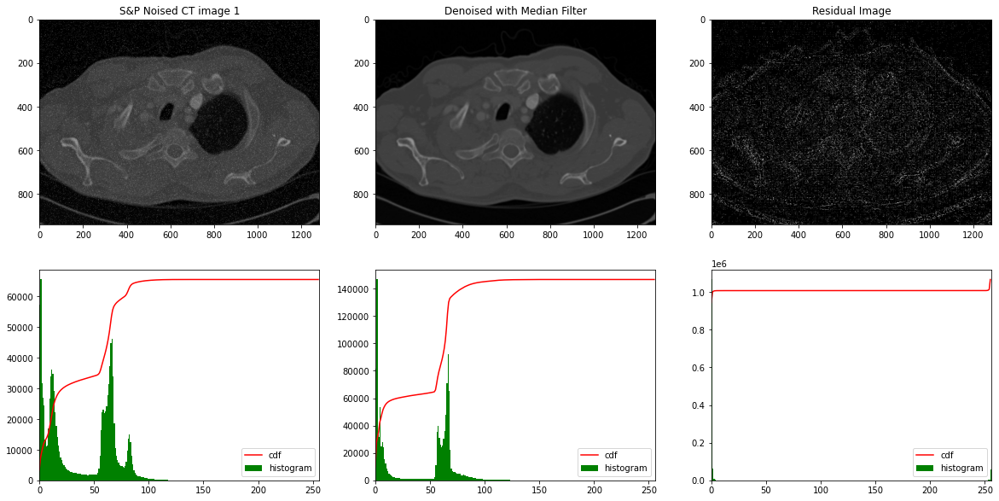

PSNR of S&P Noised CT image 1 w.r.t. to the original image:  18.09
PSNR after Denoising with Median Filter w.r.t. to S&P Noised CT image 1: 18.1
PSNR of S&P Noised CT image 1 Denoised with Median filter w.r.t. to original image:  55.0


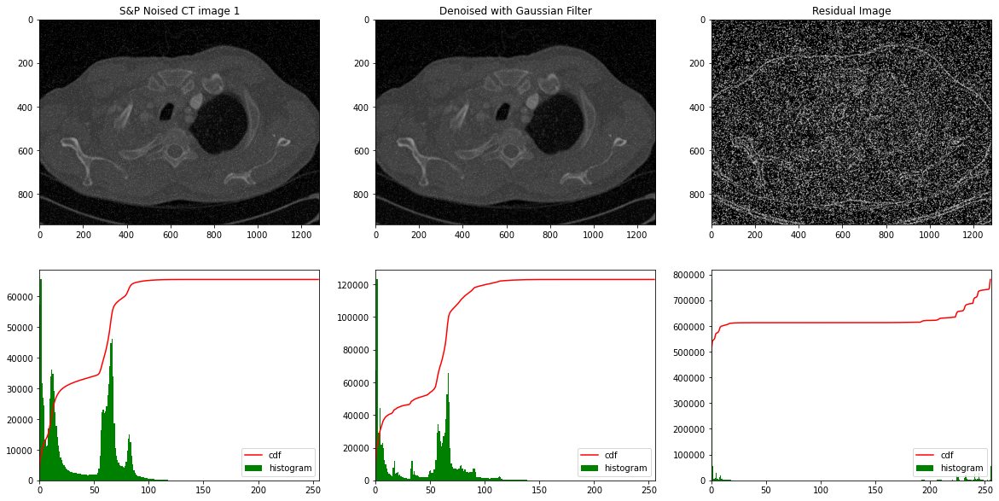

PSNR of S&P Noised CT image 1 w.r.t. to the original image:  18.09
PSNR after Denoising with Gaussian Filter w.r.t. to S&P Noised CT image 1: 20.09
PSNR of S&P Noised CT image 1 Denoised with Gaussian filter w.r.t. to original image:  26.23


In [85]:
# Denoising of S&P noised CT image 1
meanblur_denoised_sp_noised_ct1 = cv2.blur(sp_noised_ct1,(3,3))
medianblur_denoised_sp_noised_ct1 = cv2.medianBlur(sp_noised_ct1,3)
gaussianBlur_denoised_sp_noised_ct1 =  cv2.GaussianBlur(sp_noised_ct1,(3,3), 0)

psnr_meanblur_sp_noised_ct1 = filter_noised_img_and_plot(ct_img1,sp_noised_ct1, meanblur_denoised_sp_noised_ct1, "Mean", "S&P Noised CT image 1")
psnr_medianblur_sp_noised_ct1 = filter_noised_img_and_plot(ct_img1,sp_noised_ct1, medianblur_denoised_sp_noised_ct1, "Median", "S&P Noised CT image 1")
psnr_gausblur_sp_noised_ct1 = filter_noised_img_and_plot(ct_img1,sp_noised_ct1, gaussianBlur_denoised_sp_noised_ct1, "Gaussian", "S&P Noised CT image 1")


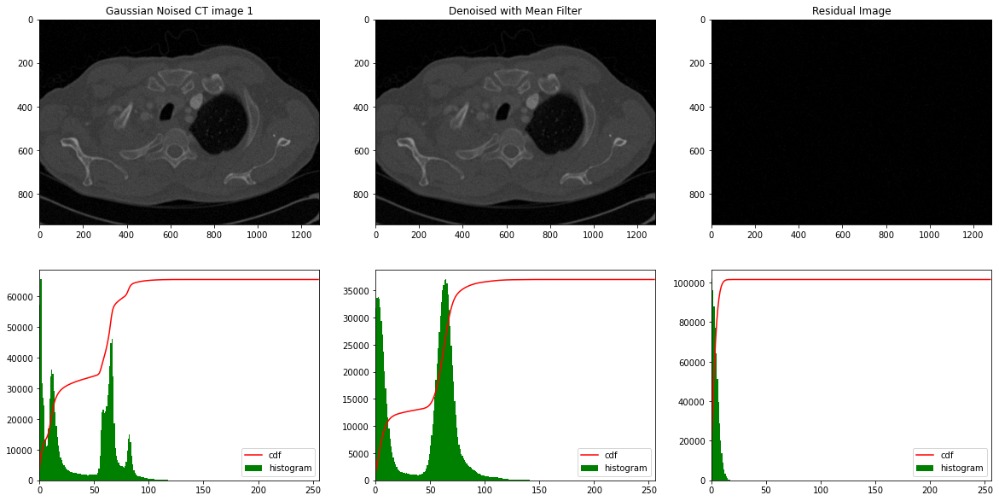

PSNR of Gaussian Noised CT image 1 w.r.t. to the original image:  25.11
PSNR after Denoising with Mean Filter w.r.t. to Gaussian Noised CT image 1: 25.62
PSNR of Gaussian Noised CT image 1 Denoised with Mean filter w.r.t. to original image:  34.6


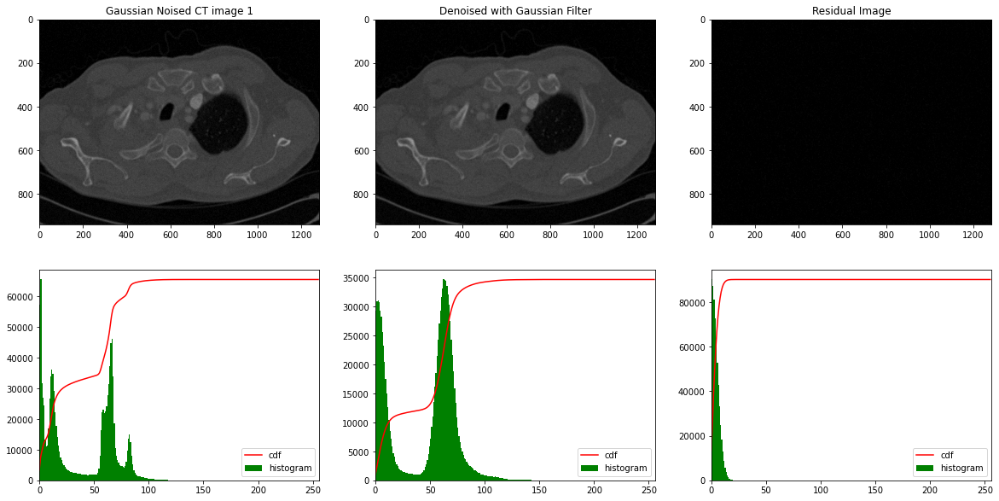

PSNR of Gaussian Noised CT image 1 w.r.t. to the original image:  25.11
PSNR after Denoising with Gaussian Filter w.r.t. to Gaussian Noised CT image 1: 27.04
PSNR of Gaussian Noised CT image 1 Denoised with Gaussian filter w.r.t. to original image:  33.61


In [76]:
# Denoising of Gausian noised CT image 1
meanblur_denoised_gaus_noised_ct1 = cv2.blur(gaus_noised_ct1,(3,3))
#medianblur_denoised_gaus_noised_ct1= cv2.medianBlur(gaus_noised_ct1,3)
gaussianBlur_denoised_gaus_noised_ct1 =  cv2.GaussianBlur(gaus_noised_ct1,(3,3), 0)

psnr_meanblur_gaus_noised_ct1 = filter_noised_img_and_plot(ct_img1,gaus_noised_ct1, meanblur_denoised_gaus_noised_ct1, "Mean", "Gaussian Noised CT image 1")
#psnr_medianblur_gaus_noised_ct1 = filter_img_and_plot(gaus_noised_ct1, medianblur_denoised_gaus_noised_ct1, "Medain", "Gausian Noised CT image 1")
psnr_gausblur_gaus_noised_ct1 = filter_noised_img_and_plot(ct_img1,gaus_noised_ct1, gaussianBlur_denoised_gaus_noised_ct1, "Gaussian", "Gaussian Noised CT image 1")


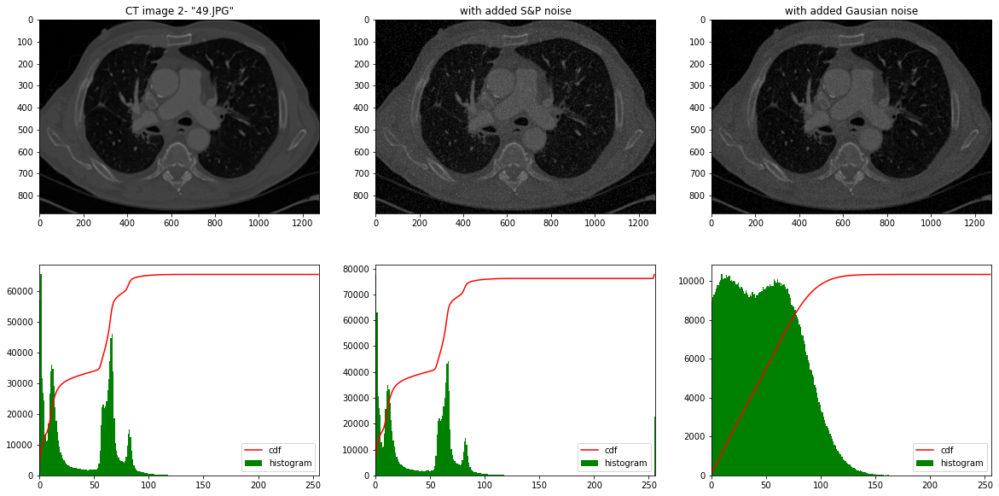

In [77]:
# Adding noise in CT image 2
sp_noised_ct2 = sp_noise(ct_img2,0.02)
gaus_noised_ct2 = add_gaussian_noise(ct_img2,500)

plt.figure(figsize = (20,10))
plt.subplot(2,3,1)
plt.imshow(ct_img2, cmap = 'gray', vmin = 0, vmax = 255 )
plt.title(label = 'CT image 2- "49.JPG"')

plt.subplot(2,3,2)
plt.imshow(sp_noised_ct2, cmap = 'gray', vmin = 0, vmax = 255 )
plt.title(label = 'with added S&P noise')

plt.subplot(2,3,3)
plt.imshow(gaus_noised_ct2, cmap = 'gray', vmin = 0, vmax = 255 )
plt.title(label = 'with added Gausian noise')

plt.subplot(2,3,4)
plotHist(ct_img2, "False")
plt.subplot(2,3,5)
plotHist(sp_noised_ct2, "False")
plt.subplot(2,3,6)
plotHist(gaus_noised_ct2, "False")
plt.show()

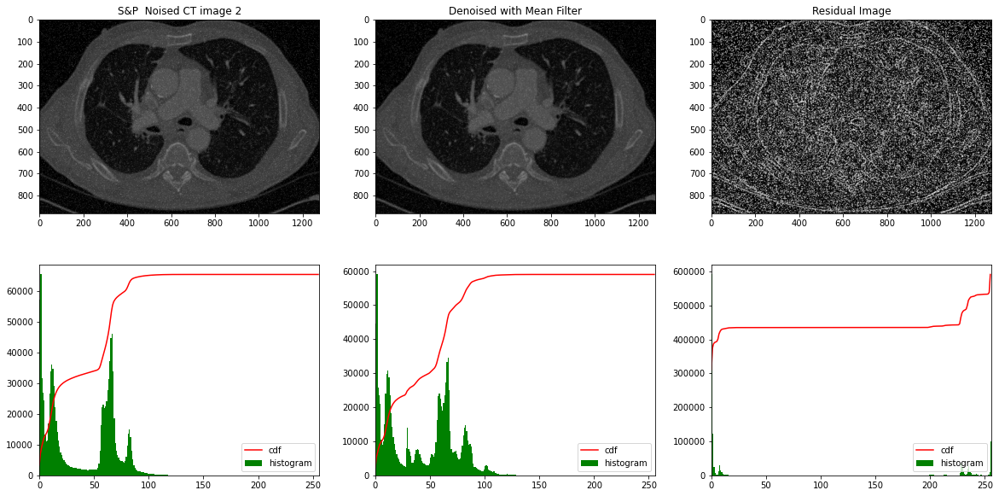

PSNR of S&P  Noised CT image 2 w.r.t. to the original image:  18.11
PSNR after Denoising with Mean Filter w.r.t. to S&P  Noised CT image 2: 18.68
PSNR of S&P  Noised CT image 2 Denoised with Mean filter w.r.t. to original image:  27.14


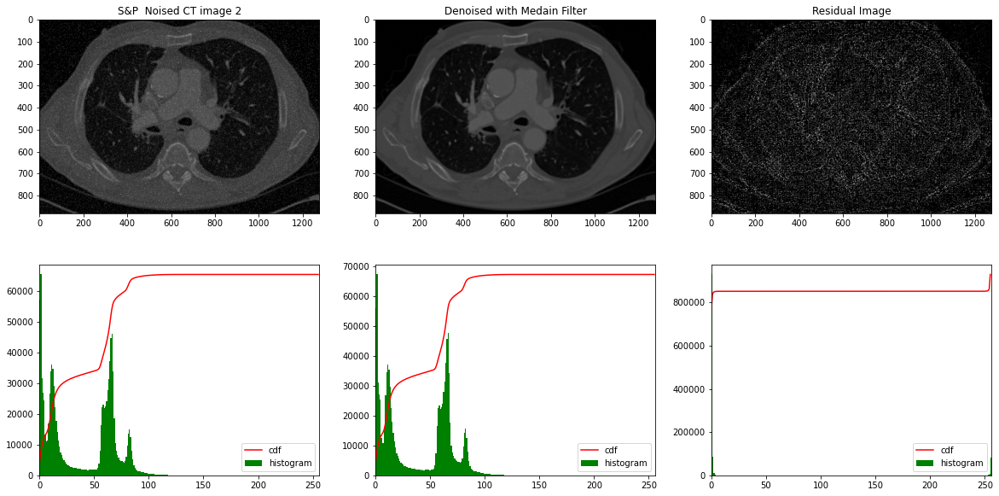

PSNR of S&P  Noised CT image 2 w.r.t. to the original image:  18.11
PSNR after Denoising with Medain Filter w.r.t. to S&P  Noised CT image 2: 18.12
PSNR of S&P  Noised CT image 2 Denoised with Medain filter w.r.t. to original image:  52.41


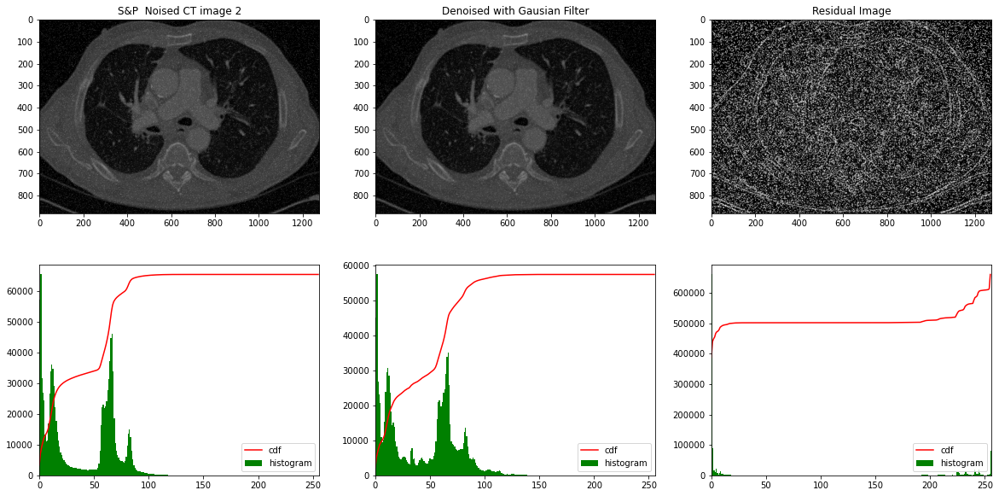

PSNR of S&P  Noised CT image 2 w.r.t. to the original image:  18.11
PSNR after Denoising with Gausian Filter w.r.t. to S&P  Noised CT image 2: 20.1
PSNR of S&P  Noised CT image 2 Denoised with Gausian filter w.r.t. to original image:  26.23


In [80]:
# Denoising of S&P noised CT image 2
meanblur_denoised_sp_noised_ct2 = cv2.blur(sp_noised_ct2,(3,3))
medianblur_denoised_sp_noised_ct2= cv2.medianBlur(sp_noised_ct2,3)
gaussianBlur_denoised_sp_noised_ct2 =  cv2.GaussianBlur(sp_noised_ct2,(3,3), 0)

psnr_meanblur_sp_noised_ct2 = filter_noised_img_and_plot(ct_img2,sp_noised_ct2, meanblur_denoised_sp_noised_ct2, "Mean", "S&P  Noised CT image 2")
psnr_medianblur_sp_noised_ct2 = filter_noised_img_and_plot(ct_img2,sp_noised_ct2, medianblur_denoised_sp_noised_ct2, "Medain", "S&P  Noised CT image 2")
psnr_gausblur_sp_noised_ct2 = filter_noised_img_and_plot(ct_img2, sp_noised_ct2, gaussianBlur_denoised_sp_noised_ct2, "Gausian", "S&P  Noised CT image 2")


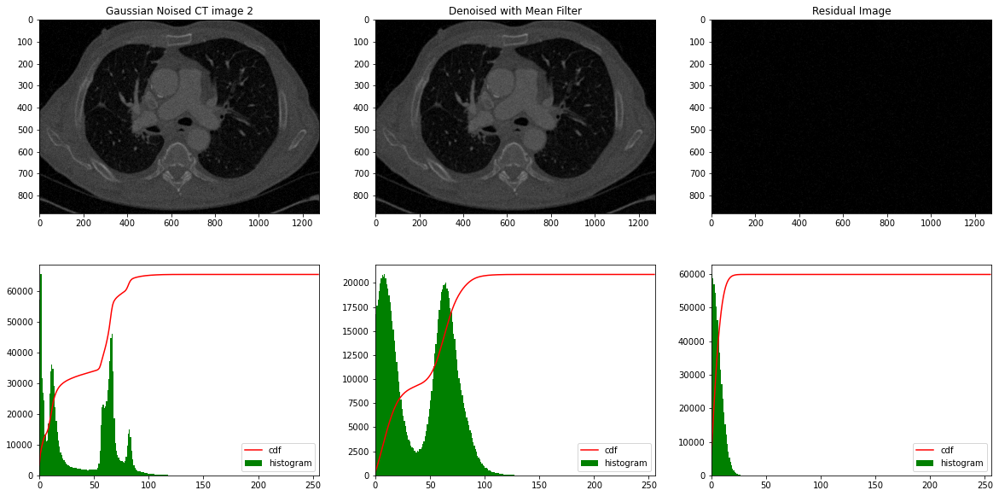

PSNR of Gaussian Noised CT image 2 w.r.t. to the original image:  21.15
PSNR after Denoising with Mean Filter w.r.t. to Gaussian Noised CT image 2: 21.66
PSNR of Gaussian Noised CT image 2 Denoised with Mean filter w.r.t. to original image:  30.63


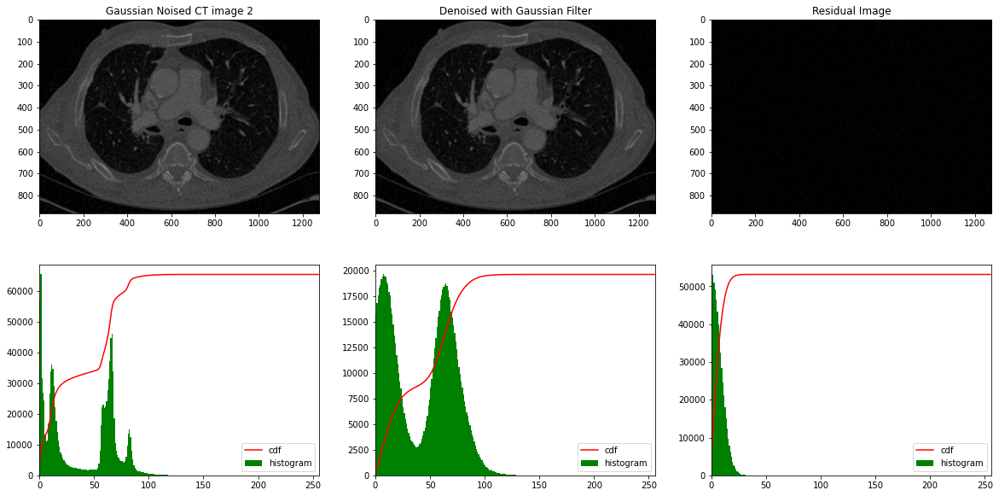

PSNR of Gaussian Noised CT image 2 w.r.t. to the original image:  21.15
PSNR after Denoising with Gaussian Filter w.r.t. to Gaussian Noised CT image 2: 23.08
PSNR of Gaussian Noised CT image 2 Denoised with Gaussian filter w.r.t. to original image:  29.63


In [84]:
# Denoising of Gausian noised CT image 2
meanblur_denoised_gaus_noised_ct2 = cv2.blur(gaus_noised_ct2,(3,3))
#medianblur_denoised_gaus_noised_ct2= cv2.medianBlur(gaus_noised_ct2,3)
gaussianBlur_denoised_gaus_noised_ct2 =  cv2.GaussianBlur(gaus_noised_ct2,(3,3), 0)

psnr_meanblur_gaus_noised_ct2 = filter_noised_img_and_plot(ct_img2,gaus_noised_ct2, meanblur_denoised_gaus_noised_ct2, "Mean", "Gaussian Noised CT image 2")
#psnr_medianblur_gaus_noised_ct2 = filter_img_and_plot(ct_img2,gaus_noised_ct2, medianblur_denoised_gaus_noised_ct2, "Median", "Gausian Noised CT image 2")
psnr_gausblur_gaus_noised_ct2 = filter_noised_img_and_plot(ct_img2,gaus_noised_ct2, gaussianBlur_denoised_gaus_noised_ct2, "Gaussian", "Gaussian Noised CT image 2")


# Part 2: Contrast enhancement and edge detection  
i. Enhance the contrast of the images. Visualize the input and the contrast enhanced image using 
histograms.  
ii. After contrast enhancement, try to detect the edges of the sternum (crop the image such that it 
encompasses atleast twice the size of the sternum) using various edge detectors and compare the 
performance of the edge detectors. 

In [23]:
def contrast_enhancements_and_plot(img, title):
    he_en = cv2.equalizeHist(img)

    clahe = cv2.createCLAHE(clipLimit = 5)
    clahe_equ = clahe.apply(img)
    plt.figure(figsize = (20,10))
    plt.subplot(2,3,1)
    plt.imshow(img, cmap = 'gray', vmin = 0, vmax = 255 )
    plt.title(label = title)
    plt.subplot(2,3,2)
    plt.imshow(he_en, cmap = 'gray', vmin = 0, vmax = 255 )
    plt.title(label = 'Histogram Equalized Image')
    plt.subplot(2,3,3)
    plt.imshow(clahe_equ, cmap = 'gray', vmin = 0, vmax = 255 )
    plt.title(label = 'CLAHE Image')
    plt.subplot(2,3,4)
    plotHist(img,"False")
    plt.subplot(2,3,5)
    plotHist(he_en,"False")
    plt.subplot(2,3,6)
    plotHist(clahe_equ,"False")
    plt.show
    return he_en, clahe_equ


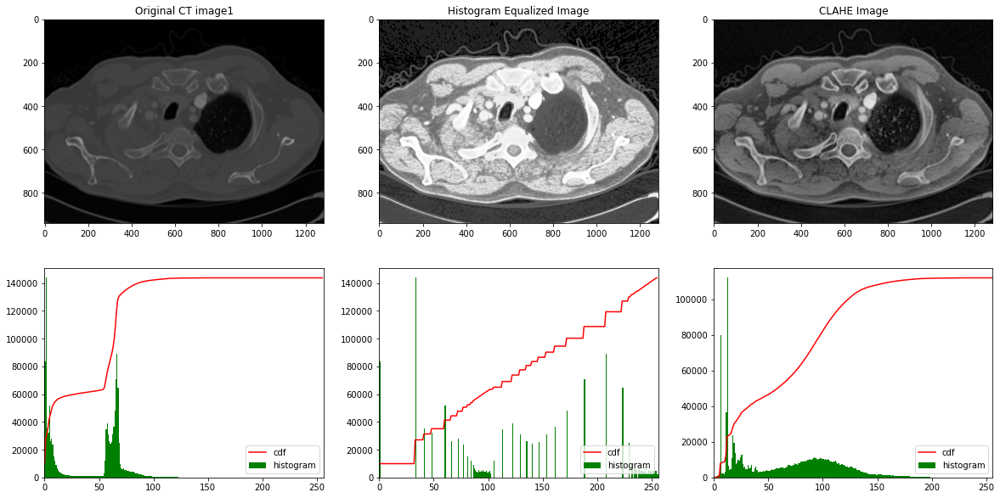

In [24]:
ct1_he, ct1_clahe = contrast_enhancements_and_plot(ct_img1, "Original CT image1")

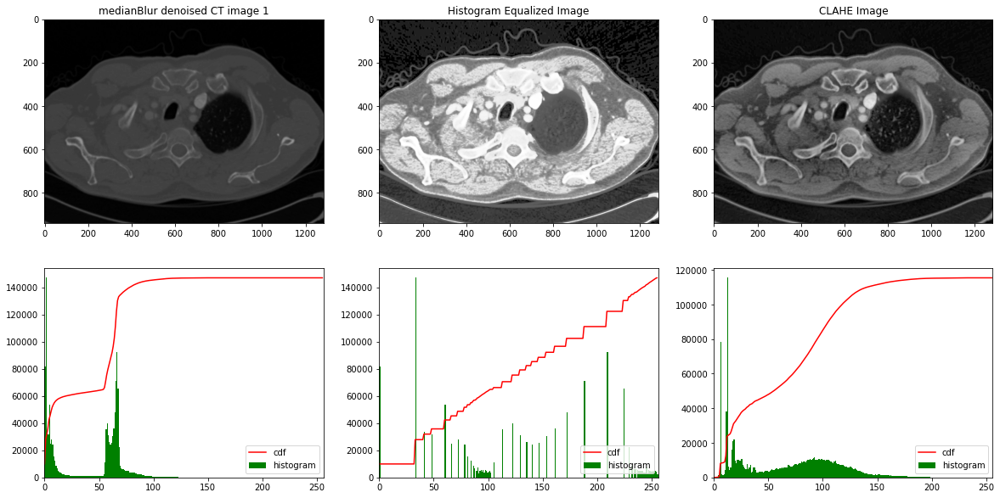

In [25]:
ct1_meadianblur_dn_he, ct1_meadianblur_dn_clahe = contrast_enhancements_and_plot(median_denoised_img1,"medianBlur denoised CT image 1" )

#median_denoised_img1
#GaussianBlur_denoised_img1
#mean_denoised_ct_img1

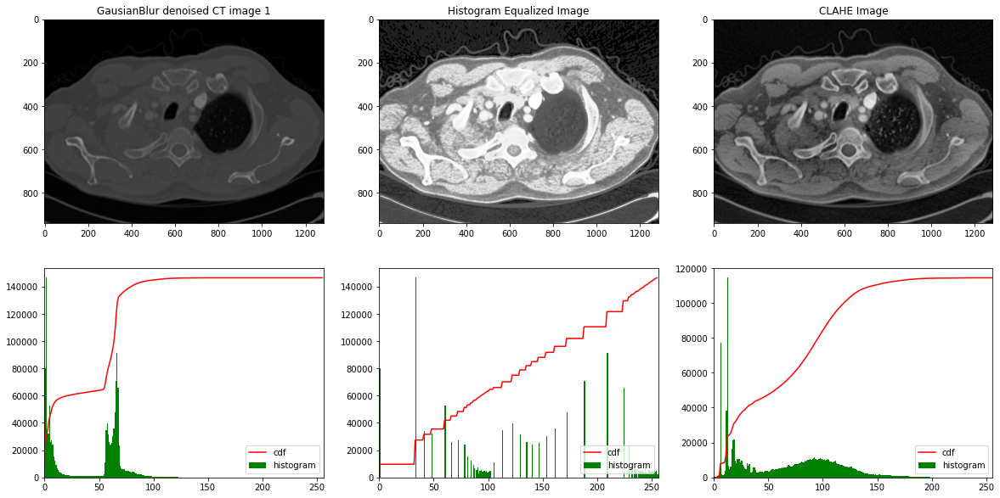

In [26]:
ct1_gausianblur_dn_he, ct1_gausianblur_dn_clahe = contrast_enhancements_and_plot(GaussianBlur_denoised_img1,"GausianBlur denoised CT image 1" )

#median_denoised_img1
#GaussianBlur_denoised_img1
#mean_denoised_ct_img1

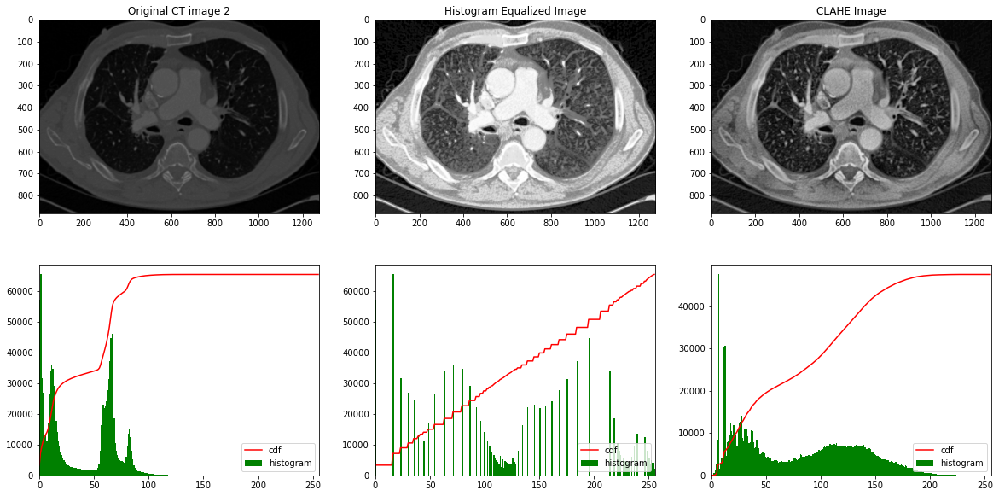

In [27]:
ct2_he, ct2_clahe = contrast_enhancements_and_plot(ct_img2,"Original CT image 2" )

#median_denoised_img1
#GaussianBlur_denoised_img1
#mean_denoised_ct_img1

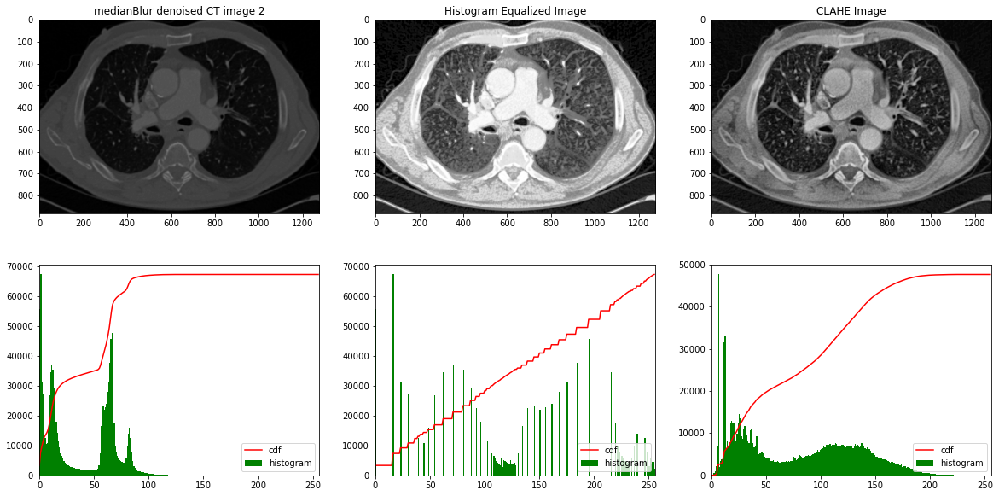

In [28]:
ct2_meadianblur_dn_he, ct2_meadianblur_dn_clahe = contrast_enhancements_and_plot(median_denoised_img2,"medianBlur denoised CT image 2" )

#median_denoised_img1
#GaussianBlur_denoised_img1
#mean_denoised_ct_img1

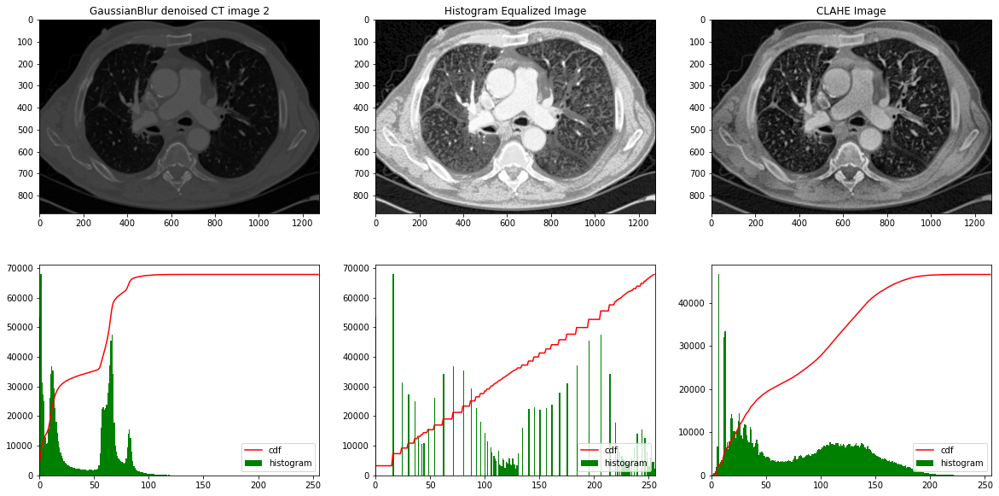

In [29]:
ct2_gausianblur_dn_he, ct2_gausianblur_dn_clahe = contrast_enhancements_and_plot(GaussianBlur_denoised_img2,"GaussianBlur denoised CT image 2" )

#median_denoised_img1
#GaussianBlur_denoised_img1
#mean_denoised_ct_img1

# Reading cropped images

In [30]:
#meanblur_denoised_gaus_noised_ct2 = cv2.blur(gaus_noised_ct2,(3,3))
#medianblur_denoised_gaus_noised_ct2= cv2.medianBlur(gaus_noised_ct2,3)
#gaussianBlur_denoised_gaus_noised_ct2 =  cv2.GaussianBlur(gaus_noised_ct2,(3,3), 0)
#d=50;s=200
#img = cv2.bilateralFilter(img5, 15, 75, 75)

In [31]:
def contrast(im1,contrast):
    #contrast = 60
    img = np.int16(im1)
    img = img * (contrast/127+1)-30
    img = np.clip(img, 0, 255)
    lo, hi=np.min(img),np.max(img)
    im2=(img-lo)/(hi-lo)*255
    im2 = np.uint8(im2)
    return im2

In [32]:
clahe = cv2.createCLAHE(clipLimit = 5)
ct1_clahe = contrast(ct_img1,160)#clahe.apply(ct_img1)
ct2_clahe = contrast(ct_img2,160) #clahe.apply(ct_img2)

cv2.imwrite("clahe_ct1.png",ct1_clahe)
cv2.imwrite("clahe_ct2.png",ct2_clahe)

True

In [33]:
ct1_gausianblur_clahe = cv2.GaussianBlur(ct_img1,(3,3), 0)
ct2_gausianblur_clahe = cv2.GaussianBlur(ct_img2,(3,3), 0)

ct1_gausianblur_clahe = clahe.apply(ct1_gausianblur_clahe)
ct2_gausianblur_clahe = clahe.apply(ct2_gausianblur_clahe)

cv2.imwrite("Gaus_clahe_ct1.png",ct1_gausianblur_clahe)
cv2.imwrite("Gaus_clahe_ct2.png",ct2_gausianblur_clahe)

True

Text(0.5, 1.0, 'Sternum CT image 2')

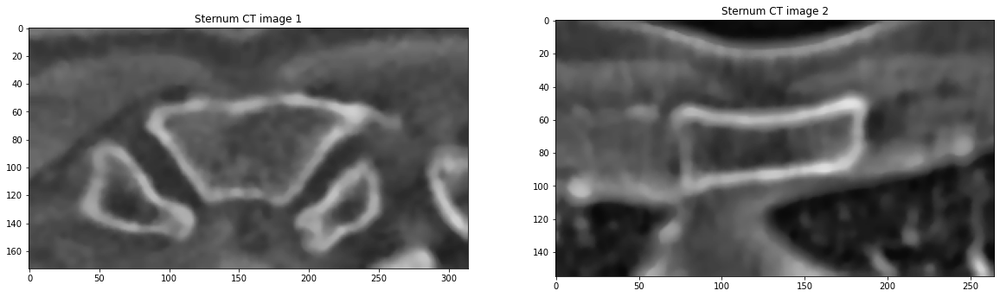

In [34]:
ct1_crop = cv2.imread('39_crop.jpg', 0)
ct2_crop = cv2.imread('49_crop.jpg', 0)

ct1_crop = cv2.GaussianBlur(ct1_crop,(5,5), 0)
ct2_crop = cv2.GaussianBlur(ct2_crop,(5,5), 0)


ct1_crop = clahe.apply(ct1_crop)
ct2_crop = clahe.apply(ct2_crop)

ct1_crop = cv2.bilateralFilter(ct1_crop, 7, 10, 50)
ct2_crop = cv2.bilateralFilter(ct2_crop, 7, 10, 50)


#ct1_crop = contrast(ct1_crop,160)
#ct2_crop = contrast(ct2_crop,160)

plt.figure(figsize = (20,10))
plt.subplot(1,2,1)
plt.imshow(ct1_crop, cmap = 'gray', vmin = 0, vmax = 255 )
plt.title(label = "Sternum CT image 1")
plt.subplot(1,2,2)
plt.imshow(ct2_crop, cmap = 'gray', vmin = 0, vmax = 255 )
plt.title(label = "Sternum CT image 2")

In [35]:
def sobel(img,title, k = 3):
    
    # define filters
    mx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])# horizontal direction
    my = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]]) # vertical direction

    h, w = img.shape
    
    X = np.zeros((h, w))
    Y = np.zeros((h, w))
    img_sobel = np.zeros((h, w))
    for i in range(1, h - 1):
        for j in range(1, w - 1):
            gx = sum(sum(mx*img[i-1:i+2,j-1:j+2]))
            X[i - 1, j - 1] = abs(gx)      
            gy = sum(sum(my*img[i-1:i+2,j-1:j+2]))
            Y[i - 1, j - 1] = abs(gy)

    sobelx = np.clip( X, 0, 255)
    sobely = np.clip( Y, 0, 255)

    sobelxy =np.clip( np.sqrt(pow(X, 2.0) + pow(Y, 2.0)), 0, 255)


    # Sobel Edge Detection on the X axis
    #sobelx = cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=2, dy=0, ksize= k) 
    # Sobel Edge Detection on the Y axis
    #sobely = cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=0, dy=1, ksize= k) 
    # Combined X and Y Sobel Edge Detection
    #sobelxy = cv2.Sobel(src=img, ddepth=cv2.CV_64F, dx=1, dy=1, ksize= k) 

    plt.figure(figsize = (20,10))
    plt.subplot(1,3,1)
    plt.imshow(sobelx, cmap = 'gray')
    plt.title(label = "sobelX- " + title)
    plt.subplot(1,3,2)
    plt.imshow(sobely, cmap = 'gray')
    plt.title(label = "sobelY- " + title)
    plt.subplot(1,3,3)
    plt.imshow(sobelxy, cmap = 'gray')
    plt.title(label = "sobelXY- " + title)
    return sobelxy

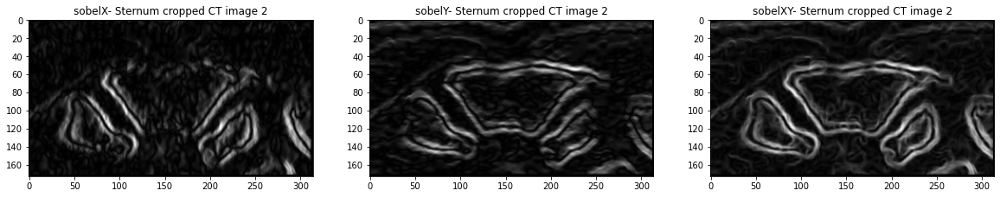

In [36]:
sobel_ct1 = sobel(ct1_crop,"Sternum cropped CT image 2",5)

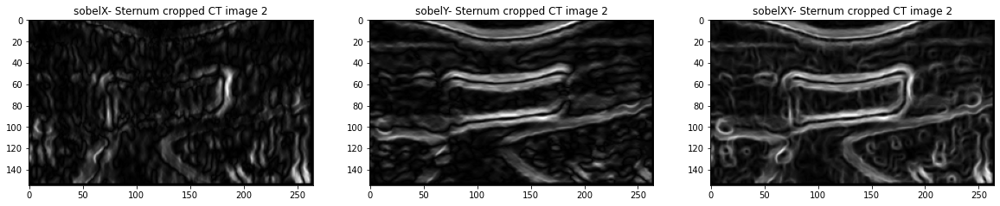

In [37]:
sobel_ct2 = sobel(ct2_crop,"Sternum cropped CT image 2",5)

In [38]:
## Laplacian
def Laplacian(img,title):
    
    h, w = img.shape
    
    mx = np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]])  
    my = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])  

    X = np.zeros((h, w))
    Y = np.zeros((h, w))
    img_laplacian = np.zeros((h, w))
    for i in range(1, h - 1):
        for j in range(1, w - 1):
            gx = sum(sum(mx*img[i-1:i+2,j-1:j+2]))
            X[i - 1, j - 1] = abs(gx)      
            gy = sum(sum(my*img[i-1:i+2,j-1:j+2]))
            Y[i - 1, j - 1] = abs(gy)

    img_laplacian = np.sqrt(pow(X, 2.0) + pow(Y, 2.0))
    #img_laplacian = cv2.Laplacian(img,cv2.CV_64F,ksize = k)

    plt.figure(figsize = (20,10))
    plt.subplot(1,3,1)
    plt.imshow(X, cmap = 'gray')
    plt.title(label = "laplacianX- " + title)
    plt.subplot(1,3,2)
    plt.imshow(Y, cmap = 'gray')
    plt.title(label = "laplacianY- " + title)
    plt.subplot(1,3,3)
    plt.imshow(img_laplacian, cmap = 'gray')
    plt.title(label = "sobelXY- " + title)

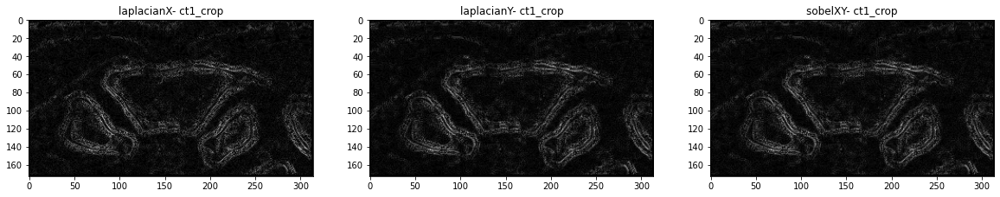

In [39]:
Laplacian(ct1_crop, "ct1_crop")

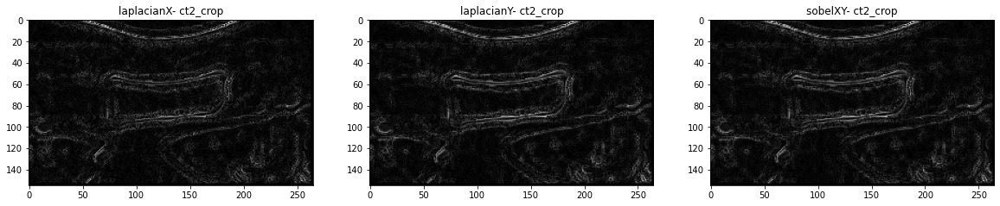

In [40]:
Laplacian(ct2_crop, "ct2_crop")

In [41]:
def canny_edgedetect(gray_image, t1 = 70, t2 = 200):

    v = np.median(gray_image)
    sigma = 0.33

    #---- Apply automatic Canny edge detection using the computed median----
    lower = int(max(0, (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma) * v))
    edged = cv2.Canny(gray_image, lower, upper)
    #cv2.imshow('Edges',edged)

    edged = cv2.Canny(gray_image, t1, t2)
    plt.figure(figsize = (5,5))
    plt.subplot(1,1,1)
    plt.imshow(edged, cmap = 'gray', vmin = 0, vmax = 255 )
    return edged
  

In [42]:
edge_1 = []
edge_2 =[]

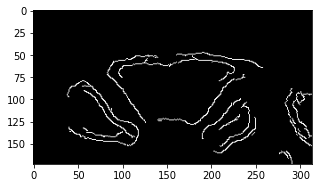

In [43]:
canny_1 = canny_edgedetect(ct1_crop,10,190)
edge_1.append(canny_1)


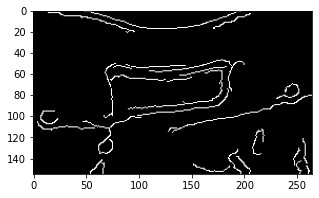

In [44]:
canny_2 = canny_edgedetect(ct2_crop,35,190)
edge_2.append(canny_2)

In [45]:
def gauss_diff(img, kl, kh):
    img_l = cv2.GaussianBlur(img,(kl,kl),0)
    img_h = cv2.GaussianBlur(img,(kh,kh),0)
    diff = img_l - img_h
    plt.figure(figsize = (5,5))
    plt.subplot(1,1,1)
    plt.imshow(diff, cmap = 'gray')

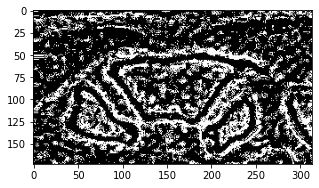

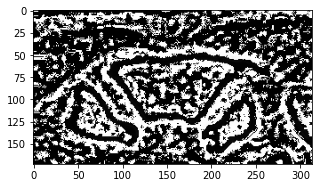

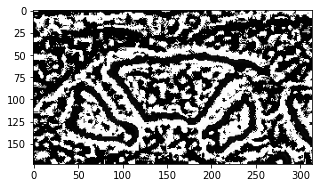

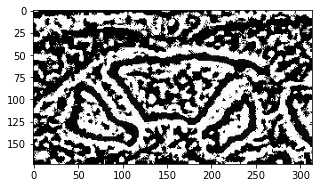

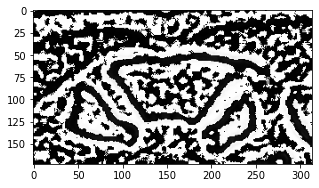

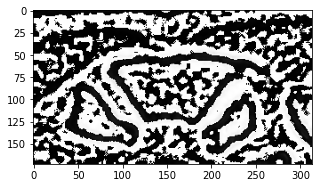

In [46]:
i = 0
for kh in [5,7,9,11,13,15]:
  gauss_diff(ct1_crop,1,kh)

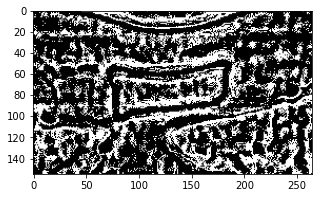

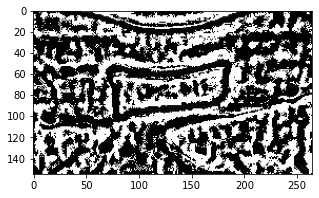

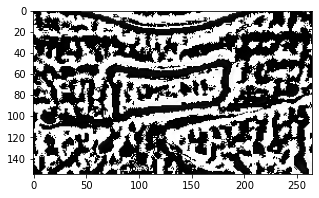

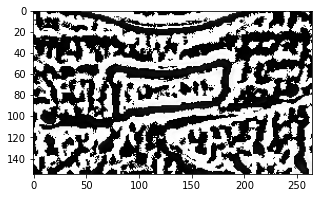

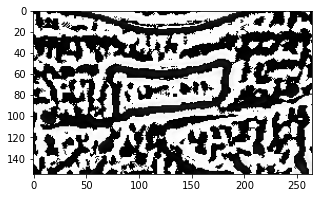

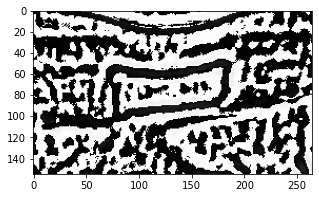

In [47]:
for kh in [5,7,9,11,13,15]:
  gauss_diff(ct2_crop, 1, kh)

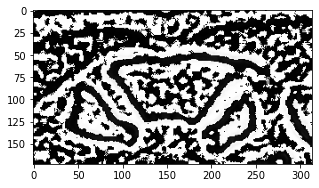

In [48]:
gauss_diff(ct1_crop,1,13)
#median_denoised_img1
#GaussianBlur_denoised_img1
#mean_denoised_ct_img1

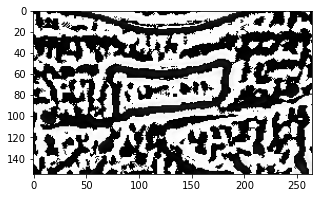

In [49]:
gauss_diff(ct2_crop,1,13)

# Part 3


In [50]:
(h1, w1) = sobel_ct1.shape

In [51]:
(h2, w2) = sobel_ct2.shape
h2

155

<function matplotlib.pyplot.show(close=None, block=None)>

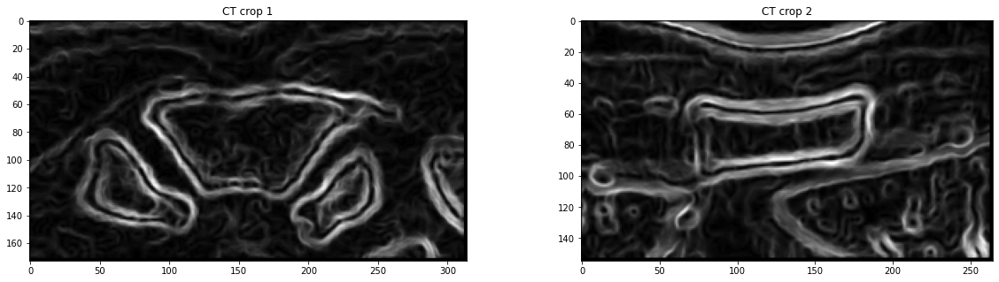

In [52]:
plt.figure(figsize = (20,5))
plt.subplot(1,2,1)
plt.title(label = "CT crop 1")
plt.imshow(sobel_ct1, cmap = 'gray')

plt.subplot(1,2,2)
plt.title(label = "CT crop 2")
plt.imshow(sobel_ct2, cmap = 'gray')
plt.show

In [53]:
def hough_line(img, angle_step=1, lines_are_white=True, value_threshold=5):
    """
    Hough transform for lines
    Input:
    img - 2D binary image with nonzeros representing edges
    angle_step - Spacing between angles to use every n-th angle
                 between -90 and 90 degrees. Default step is 1.
    lines_are_white - boolean indicating whether lines to be detected are white
    value_threshold - Pixel values above or below the value_threshold are edges
    Returns:
    accumulator - 2D array of the hough transform accumulator
    theta - array of angles used in computation, in radians.
    rhos - array of rho values. Max size is 2 times the diagonal
           distance of the input image.
    """
    # Rho and Theta ranges
    thetas = np.deg2rad(np.arange(-90.0, 90.0, angle_step))
    width, height = img.shape
    diag_len = int(round(math.sqrt(width * width + height * height)))
    rhos = np.linspace(-diag_len, diag_len, diag_len * 2)

    # Cache some resuable values
    cos_t = np.cos(thetas)
    sin_t = np.sin(thetas)
    num_thetas = len(thetas)

    # Hough accumulator array of theta vs rho
    accumulator = np.zeros((2 * diag_len, num_thetas), dtype=np.uint8)
    # (row, col) indexes to edges
    are_edges = img > value_threshold if lines_are_white else img < value_threshold
    y_idxs, x_idxs = np.nonzero(are_edges)

    # Vote in the hough accumulator
    for i in range(len(x_idxs)):
        x = x_idxs[i]
        y = y_idxs[i]

        for t_idx in range(num_thetas):
            # Calculate rho. diag_len is added for a positive index
            rho = diag_len + int(round(x * cos_t[t_idx] + y * sin_t[t_idx]))
            accumulator[rho, t_idx] += 1

    return accumulator, thetas, rhos


def show_hough_line(img, accumulator, thetas, rhos, save_path=None):
    import matplotlib.pyplot as plt

    fig, ax = plt.subplots(1, 2, figsize=(20, 10))

    ax[0].imshow(img, cmap=plt.cm.gray)
    ax[0].set_title('Input image')
    ax[0].axis('image')

    ax[1].imshow(
        accumulator, cmap='jet',
        extent=[np.rad2deg(thetas[-1]), np.rad2deg(thetas[0]), rhos[-1], rhos[0]])
    ax[1].set_aspect('equal', adjustable='box')
    ax[1].set_title('Hough transform')
    ax[1].set_xlabel('Angles (degrees)')
    ax[1].set_ylabel('Distance (pixels)')
    ax[1].axis('image')

    # plt.axis('off')
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()



In [54]:
# Create binary image and call hough_line
image = sobel_ct2
#image= np.zeros((50,50))
image[10:40, 10:40] = np.eye(30)
accumulator, thetas, rhos = hough_line(image)

# Easiest peak finding based on max votes
idx = np.argmax(accumulator)
#rho = rhos[idx / accumulator.shape[1]]
theta = thetas[idx % accumulator.shape[1]]
#print("rho={0: ", format(rho), "theta={1: ",format( np.rad2deg(theta)))

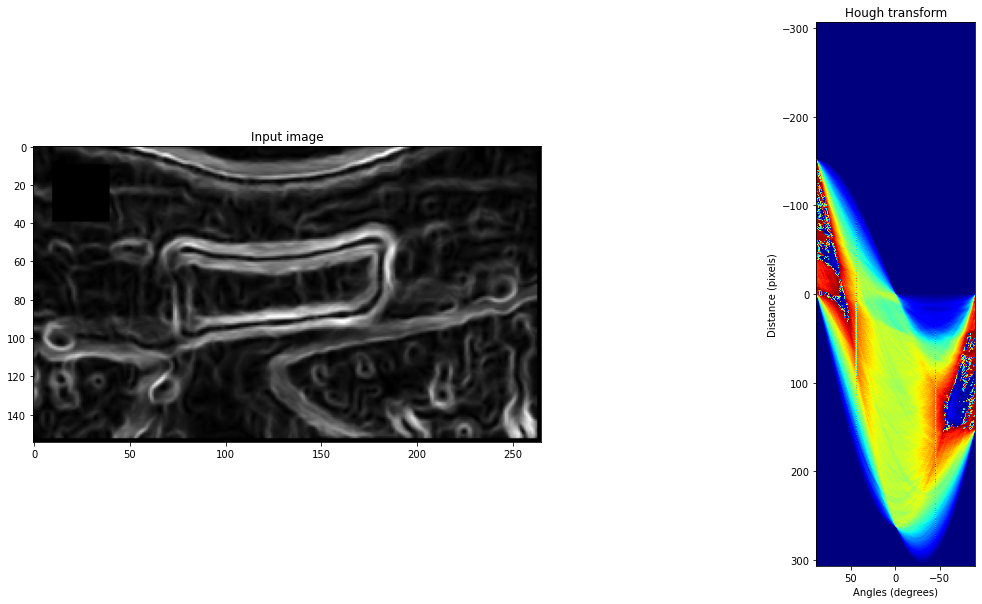

In [55]:
show_hough_line(image, accumulator, thetas, rhos, save_path=None)


In [56]:
def hough_accumulator(img,thres,m):
    """
    Hough transform for lines
    
    """
    
    # a and b ranges
    w, h = img.shape
    print("image shape: ", img.shape)
    l = int(round(np.sqrt(w**2+ h**2)))
    t=np.linspace(0,1,l+1)
    # Hough accumulator array l
    
    # (row, col) indexes to edges
    idx = img > thres
    y_idxs, x_idxs = np.nonzero(idx)
    
    accumulator = np.zeros((l+1, len(t)), dtype=np.uint8) # l+1=len(t)
    print("shape of acc:",accumulator.shape)
    A = np.zeros((len(x_idxs), len(t)))
    B = np.zeros((len(x_idxs), len(t)))
    # Vote in the hough accumulator
    for i in range(len(x_idxs)):
        x = (x_idxs[i]-w/2)/w
        y = (y_idxs[i]-h/2)/h
    
        for j in range(len(t)):
            # Calculate rho. diag_len is added for a positive index
            A[i,j]=t[j];
            
            B[i,j]=t[j]**m*y**m/(t[j]**m-x**m)
            try:
                if B[i,j]>0:
                    i1=int(round(t[j]*l))
                    j1=int(round(B[i,j]*l))
                    accumulator[j1,i1] += 1
            except:
                continue
    return A, B,accumulator

def plot_hough(img,accumulator):
    fig, ax = plt.subplots(1, 2, figsize=(10, 10))

    ax[0].imshow(img, 'gray')
    ax[0].set_title('Input image')
    ax[0].axis('image')

    ax[1].imshow(accumulator*255/max(accumulator.flatten()),cmap='jet', extent=[0, 1, 1, 0])
    #ax[1].imshow( accumulator, cmap='jet')
    ax[1].set_title('Projection of Hough transform')
    ax[1].set_xlabel('A')
    ax[1].set_ylabel('B')
    ax[1].axis('image')
    
def draw_super_ellipcse(img, accumulator, A, B):
    h, w = img.shape
    l = int(round(np.sqrt(w**2+ h**2)))
    As,Bs=np.where(accumulator == accumulator.max()) #Returns indixes where it follows the condition
    print('As: ', As)
    print('Bs: ', Bs)

    # As[-1] -> returns the Max value element
    A,B= 0.35*As[-1]*h, Bs[-1]*w
    print('A: ', A)
    print('B: ', B)

    x=np.linspace(-80,80,1000);

    y=(((A**m*B-B*x**m))**(1/m))/A
    #y=(((B**m-(B*x/A)**m))**(1/m))

    plt.imshow(img, 'gray',)
    plt.plot(x+w/2,y+h/2, 'g',linewidth=5)
    plt.plot(x+w/2,-y+h/2,'g',linewidth=5)
    plt.axis('equal')


image shape:  (173, 314)
shape of acc: (360, 360)


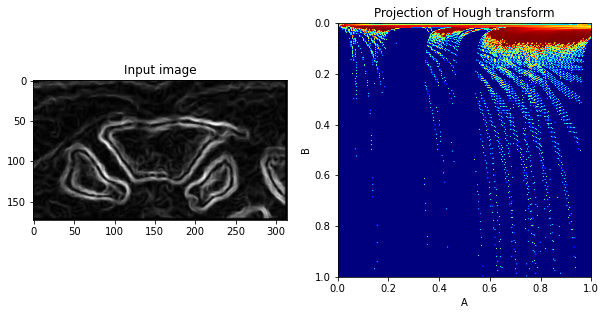

In [57]:
img1 = sobel_ct1
thres1 = 125
m=4

A1, B1, accumulator1 = hough_accumulator(img1,thres1,m)

plot_hough(img1,accumulator1)


As:  [1 1 1 1]
Bs:  [327 329 334 353]
A:  60.55
B:  110842


<ipython-input-56-390978a3698c>:69: RuntimeWarning: invalid value encountered in power
  y=(((A**m*B-B*x**m))**(1/m))/A


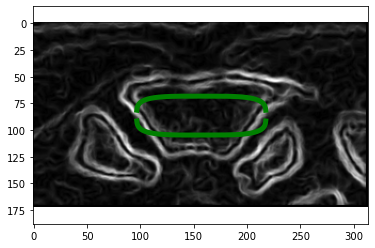

In [58]:
draw_super_ellipcse(img1, accumulator1, A1, B1)

# Hough Transform for the CT image 2

image shape:  (155, 265)
shape of acc: (308, 308)


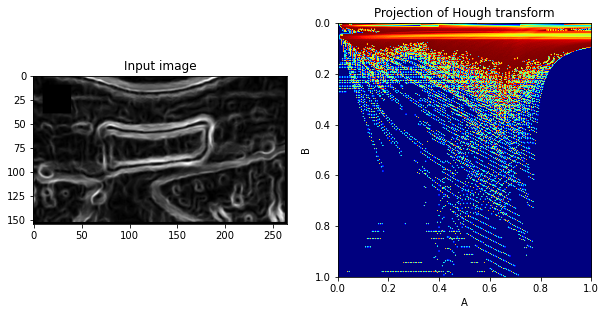

In [59]:
img2 = sobel_ct2
thres2 = 101
m=4

A2, B2, accumulator2 = hough_accumulator(img2,thres2,m)

plot_hough(img2,accumulator2)

As:  [0 0 1]
Bs:  [168 277 273]
A:  54.25
B:  72345


<ipython-input-56-390978a3698c>:69: RuntimeWarning: invalid value encountered in power
  y=(((A**m*B-B*x**m))**(1/m))/A


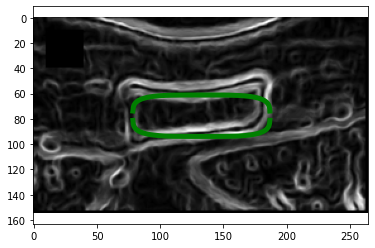

In [60]:
draw_super_ellipcse(img2, accumulator2, A2, B2)